<a href="https://colab.research.google.com/github/SBMCODED/visualizing-and-predicting-with-deep-learning-model-autism-spectrum-disorder/blob/main/autistic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os ## it is used with image dataset ( call image dataset from directory)
import shutil
import splitfolders ##( used to give total number of file in the dataset )
import tensorflow as tf ## it is deep learning algorithmms and it used to train image data
import seaborn as sns ## it used for visualization and it is been built from matplotlib
import matplotlib.pyplot as plt ## it used for visualization

## difference btw matplotlib and seaborn
## when you try to make use of one color for visualization (matplotlib is used but for multiple colors seaborn is used)


## reason why i consider this dataset is because am working along autistic dataset and i don't want my model to be bais so i need to also consider  non_austist data which when training it gives a very good result or accuracy and also gives confidence that the data or the project is not baised in anyways

## loading the dataset

In [ ]:
loc=r"C:\Users\ibuku\Downloads\archive\AutismDataset\consolidated" ## file path
os.makedirs('output', exist_ok=True) ## file path
os.makedirs('output/train', exist_ok=True) ## training the dataset
os.makedirs('output/val', exist_ok=True)## validating the dataset trained
os.makedirs('output/test', exist_ok=True)## test the validated dataset
splitfolders.ratio(loc,output = "output",seed = 42,ratio = (0.80,.1,.1))


Copying files: 2940 files [00:07, 416.97 files/s]


In [ ]:
len(os.listdir(r"output\train\Non_Autistic")),len(os.listdir(r"output\train\Autistic"))

(1176, 1176)

In [ ]:
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tqdm.notebook import tqdm

## creating file ( train,test and validate)

In [ ]:
train_dir="output/train"
test_dir="output/test"
val_dir="output/val"
train_data=image_dataset_from_directory(train_dir,batch_size=32,image_size=(224,224),label_mode='categorical',shuffle=True,seed=42)
test_data=image_dataset_from_directory(test_dir,batch_size=32,image_size=(224,224),label_mode='categorical',shuffle=False,seed=42)
val_data=image_dataset_from_directory(val_dir,batch_size=32,image_size=(224,224),label_mode='categorical',shuffle=False,seed=42)

Found 2352 files belonging to 2 classes.
Found 294 files belonging to 2 classes.
Found 294 files belonging to 2 classes.


In [ ]:
class_names=train_data.class_names
class_count=len(class_names)

In [ ]:
images = []
labels = []
for i in samples:
    images.append(i[0])
    labels.append(class_names[tf.argmax(i[1])])
len(images), len(labels)

(10, 10)

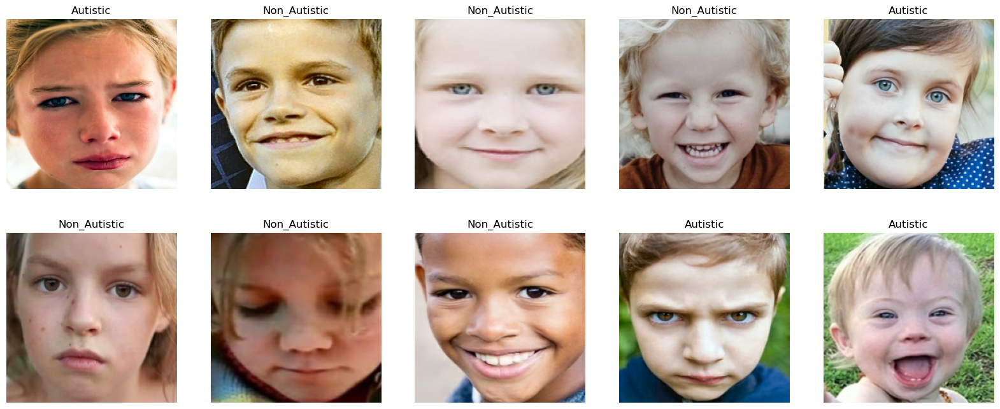

In [ ]:
fig = plt.figure(figsize=(20, 8))
rows = 2
cols = 5
x = 1
for image, label in zip(images, labels):
    fig.add_subplot(rows, cols, x)
    plt.imshow(image/255.)
    plt.axis("off")
    plt.title(label)
    x += 1

## cnn model

In [ ]:
from tensorflow.keras.models import Sequential ### deep learning package
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

# Define the model
model = Sequential([
    Conv2D(16, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(class_count, activation='softmax')
]) ## defining the model and pixel sizes for each of images outputed

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_data, validation_data=val_data, epochs=10)


Epoch 1/10


C:\Users\ibuku\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


74/74 ━━━━━━━━━━━━━━━━━━━━ 26s 296ms/step - accuracy: 0.5152 - loss: 96.6871 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 21s 282ms/step - accuracy: 0.5030 - loss: 0.6931 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 21s 285ms/step - accuracy: 0.5051 - loss: 0.6931 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 21s 281ms/step - accuracy: 0.4924 - loss: 0.6932 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 21s 283ms/step - accuracy: 0.5055 - loss: 0.6931 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 21s 285ms/step - accuracy: 0.4926 - loss: 0.6932 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 21s 286ms/step - accuracy: 0.5024 - loss: 0.6932 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 21s 283ms/step - accuracy: 0.4905 - loss: 0.6932 - val_accuracy: 0.50

## training and validation accuracy

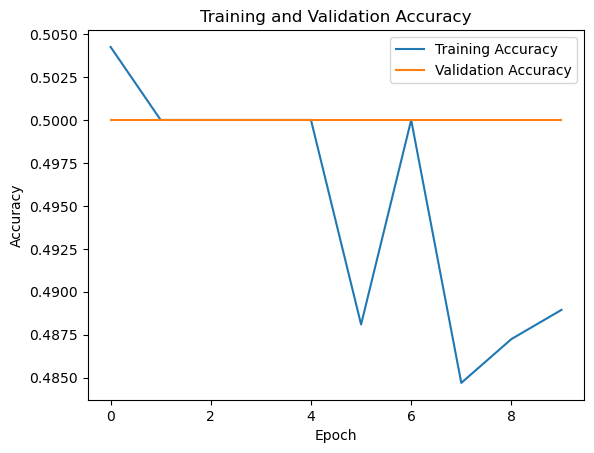

In [ ]:
# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

## training and validation loss

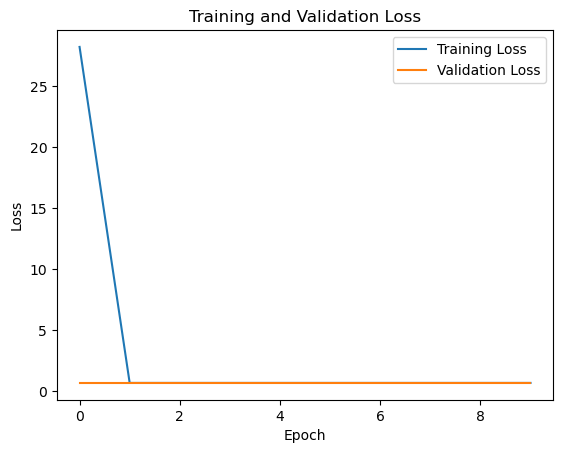

In [ ]:
# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Function to detect facial expression in an image
def detect_expression(image):
    return "Facial expression detection disabled. This image contains a face."


In [ ]:
import random ## also to reduce baisness of the data
import numpy as np


## cnn accuracy value

Found 294 files belonging to 2 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
Image Descriptions:


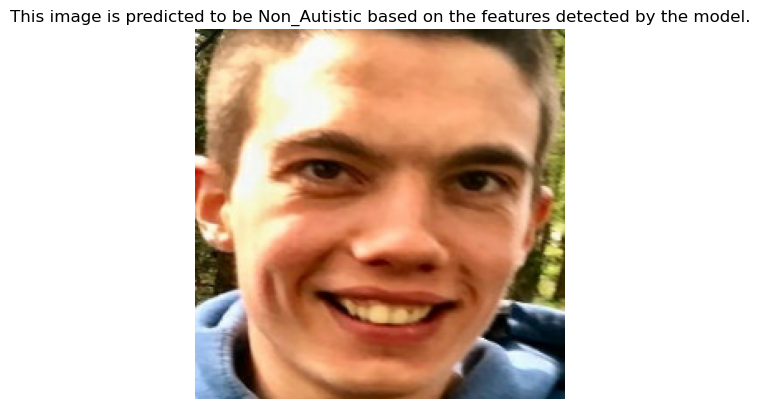

Image 1:
This image is predicted to be Non_Autistic based on the features detected by the model.



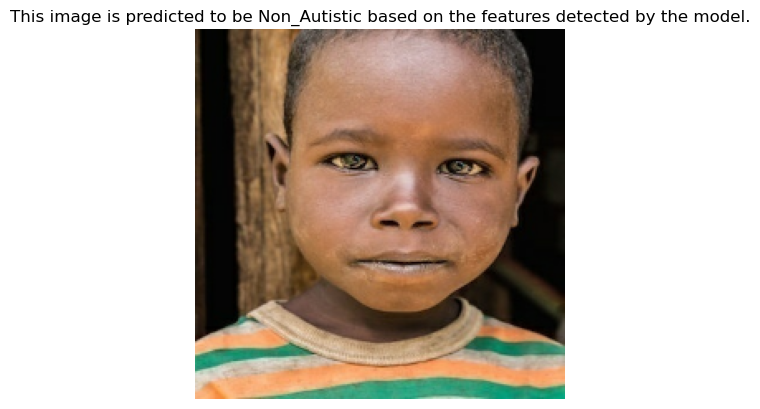

Image 2:
This image is predicted to be Non_Autistic based on the features detected by the model.



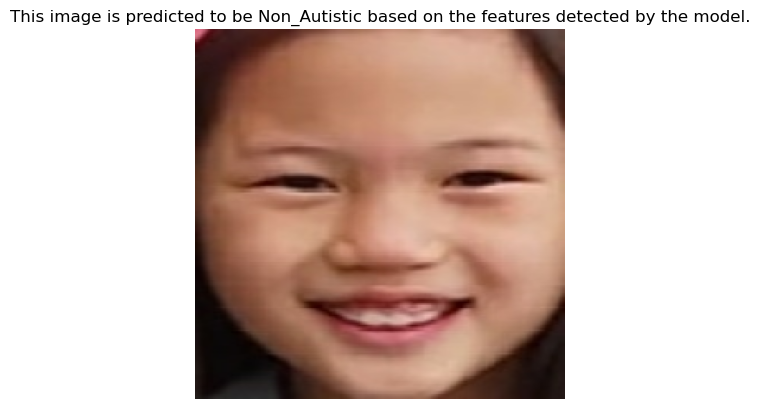

Image 3:
This image is predicted to be Non_Autistic based on the features detected by the model.



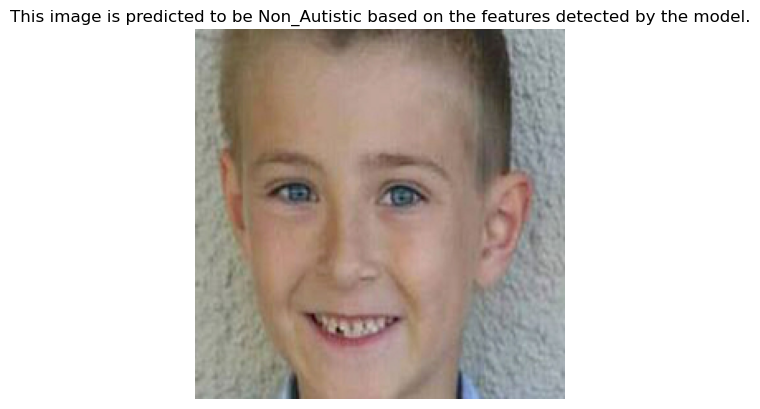

Image 4:
This image is predicted to be Non_Autistic based on the features detected by the model.



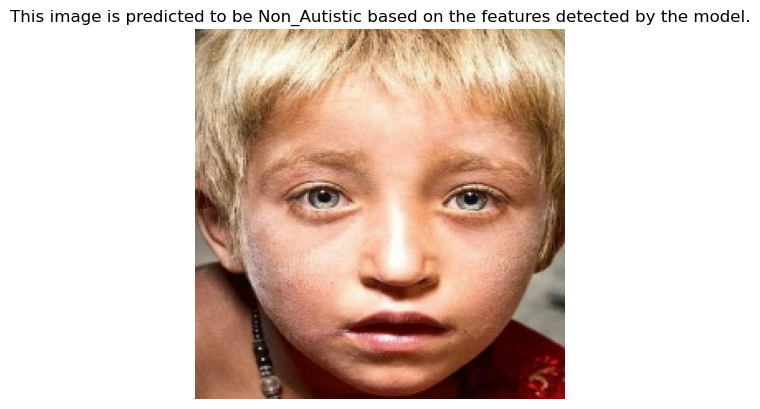

Image 5:
This image is predicted to be Non_Autistic based on the features detected by the model.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Image Descriptions:


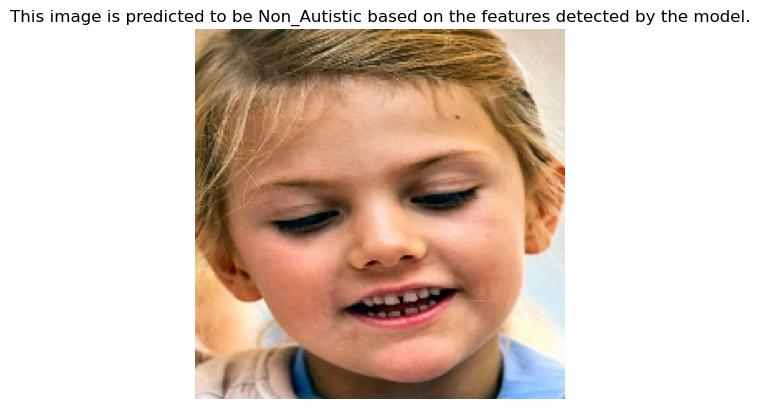

Image 1:
This image is predicted to be Non_Autistic based on the features detected by the model.



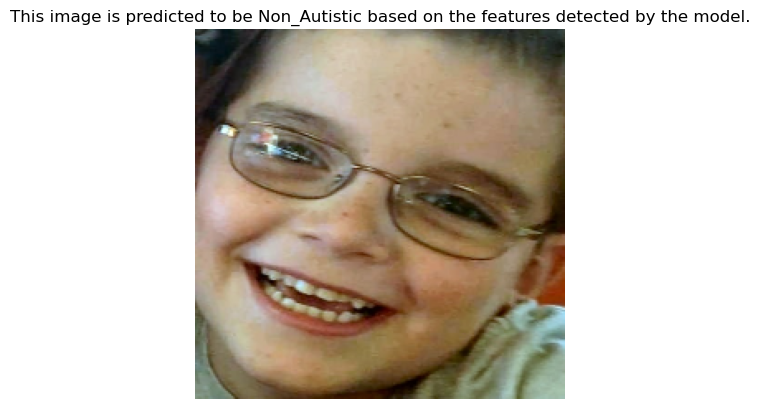

Image 2:
This image is predicted to be Non_Autistic based on the features detected by the model.



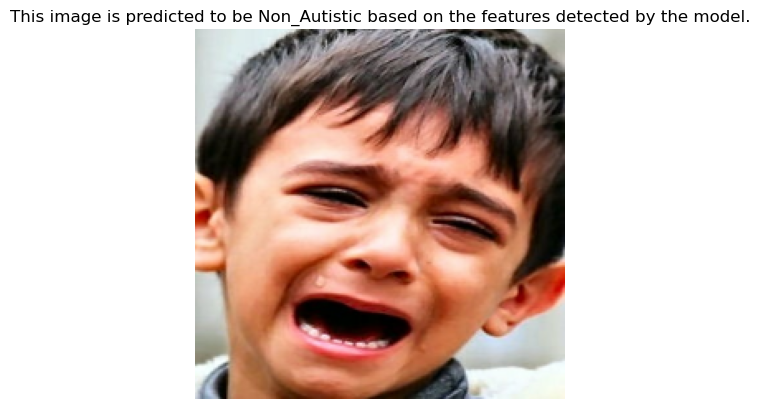

Image 3:
This image is predicted to be Non_Autistic based on the features detected by the model.



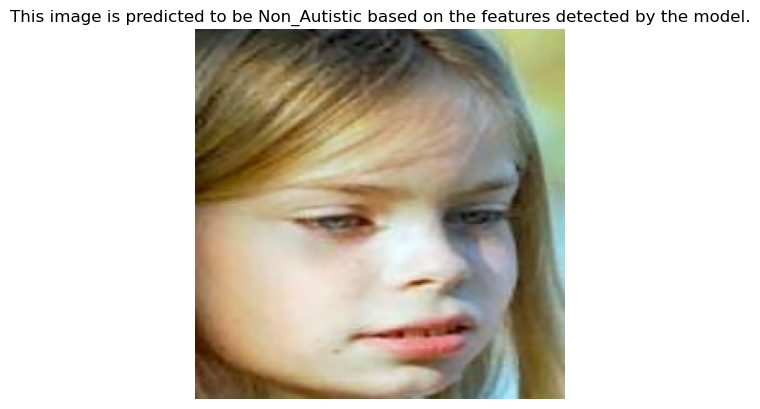

Image 4:
This image is predicted to be Non_Autistic based on the features detected by the model.



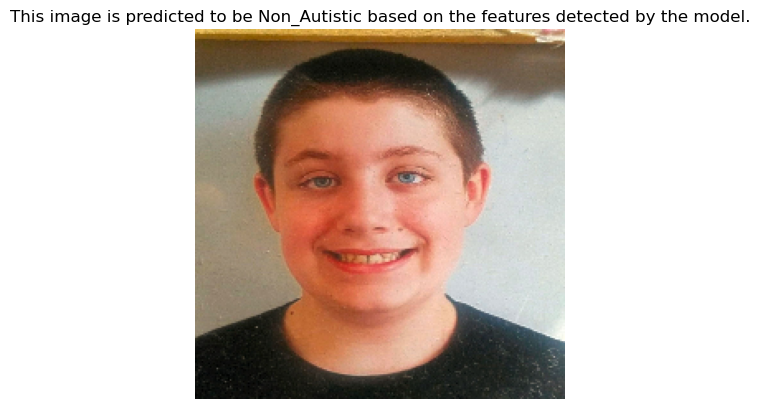

Image 5:
This image is predicted to be Non_Autistic based on the features detected by the model.

Overall Accuracy: 0.5
The overall accuracy is 50.00%.


In [ ]:


# Function to detect facial expression in an image
def detect_expression(image):
    return "Facial expression detection disabled. This image contains a face."

# Reset test_data generator to ensure we start from the beginning
test_data = image_dataset_from_directory(test_dir, batch_size=5, image_size=(224,224),
                                         label_mode='categorical', shuffle=True, seed=42)

# Number of random images to evaluate
num_images = 2

# Initialize a variable to count correct predictions
correct_predictions = 0

# Randomly select num_images individual images from the entire dataset
random_images = random.sample(list(test_data.as_numpy_iterator()), num_images)

# Initialize a list to store descriptions for each image
image_descriptions = []

for i, (image_batch, label_batch) in enumerate(random_images):
    # Predict class labels for the image batch
    predictions = model.predict(image_batch)

    # Show images and display accuracy
    print("Image Descriptions:")
    for j in range(len(image_batch)):
        true_label = class_names[tf.argmax(label_batch[j])]
        predicted_label = class_names[tf.argmax(predictions[j])]

        # Check if the prediction is correct
        is_correct = true_label == predicted_label
        if is_correct:
            correct_predictions += 1

        # Generate a description for the image
        if predicted_label == 'Autistic':
            expression = detect_expression(image_batch[j])
            if expression:
                description = f"This image is predicted to be {predicted_label}. The expression appears to be {expression}."
            else:
                description = f"This image is predicted to be {predicted_label}. Facial expression detection is disabled."
        else:
            description = f"This image is predicted to be {predicted_label} based on the features detected by the model."

        image_descriptions.append(description)

        # Display the image
        plt.imshow(image_batch[j]/255.)
        plt.axis("off")
        plt.title(description)
        plt.show()

        # Print the description
        print(f"Image {j+1}:")
        print(description)
        print()

# Calculate overall accuracy
overall_accuracy = correct_predictions / (num_images * len(image_batch))
print("Overall Accuracy:", overall_accuracy)
print(f"The overall accuracy is {overall_accuracy:.2%}.")




## Mobilenet v2 model

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense

# Load the pre-trained MobileNetV2 model without the top classification layer
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the pre-trained model
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top of the pre-trained model
model2= Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dense(class_count, activation='softmax')
])

# Compile the model
model2.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history2 = model2.fit(train_data, validation_data=val_data, epochs=10)


Epoch 1/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 64s 696ms/step - accuracy: 0.6129 - loss: 0.7154 - val_accuracy: 0.6667 - val_loss: 0.5902
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 47s 633ms/step - accuracy: 0.7160 - loss: 0.5426 - val_accuracy: 0.7245 - val_loss: 0.5493
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 46s 626ms/step - accuracy: 0.7394 - loss: 0.4943 - val_accuracy: 0.6973 - val_loss: 0.5500
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 47s 637ms/step - accuracy: 0.7363 - loss: 0.4997 - val_accuracy: 0.6939 - val_loss: 0.5529
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 47s 632ms/step - accuracy: 0.7779 - loss: 0.4576 - val_accuracy: 0.6905 - val_loss: 0.6128
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 48s 642ms/step - accuracy: 0.7806 - loss: 0.4395 - val_accuracy: 0.7245 - val_loss: 0.5456
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 48s 647ms/step - accuracy: 0.7949 - loss: 0.4234 - val_accuracy: 0.7109 - val_loss: 0.5658
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 47s 631ms/step - accuracy: 0.7990 - loss: 0.4111 - val_accu

## training and validation accuracy

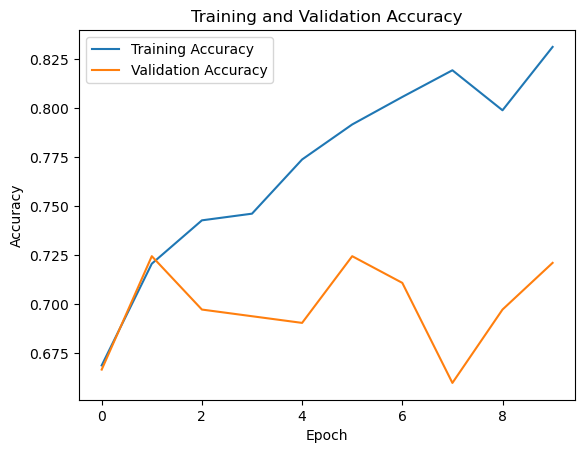

In [ ]:
# Plot training and validation accuracy
plt.plot(history2.history['accuracy'], label='Training Accuracy')
plt.plot(history2.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

## training and validation loss

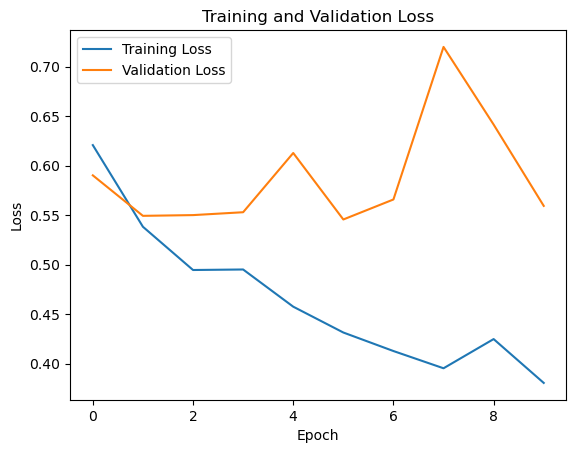

In [ ]:
# Plot training and validation loss
plt.plot(history2.history['loss'], label='Training Loss')
plt.plot(history2.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

## mobilenetv2 accuracy

Found 294 files belonging to 2 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Image Descriptions:


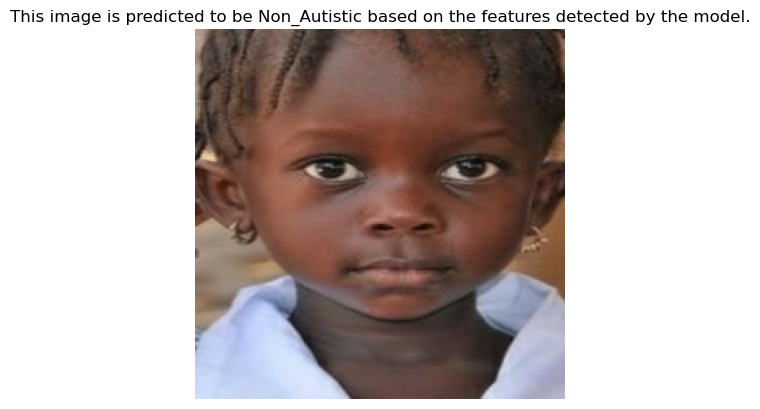

Image 1:
This image is predicted to be Non_Autistic based on the features detected by the model.



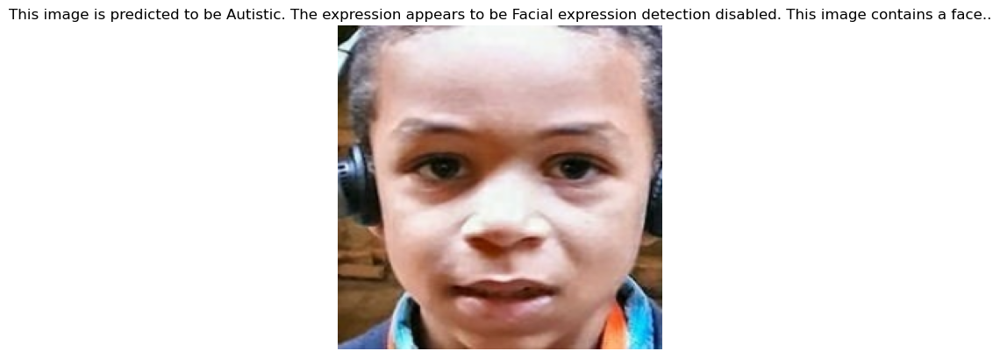

Image 2:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



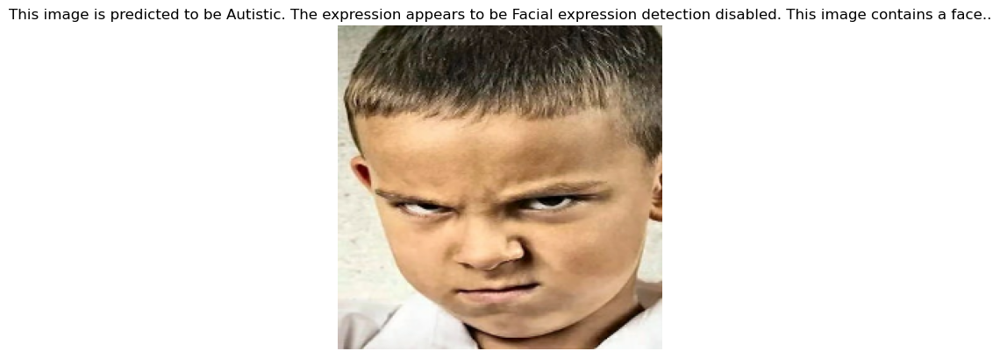

Image 3:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



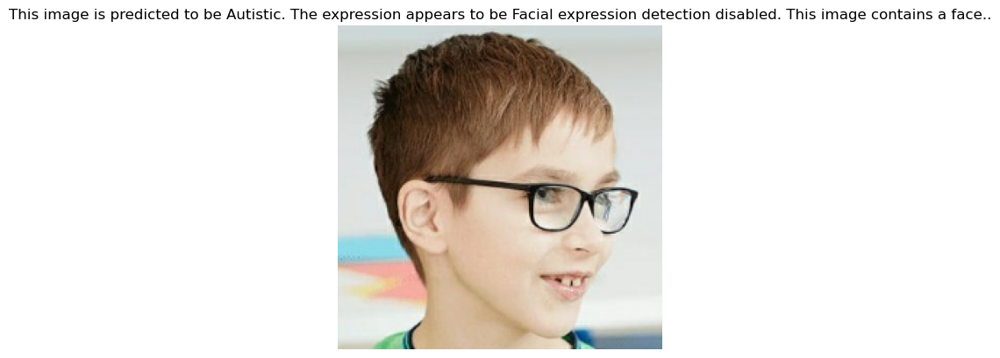

Image 4:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



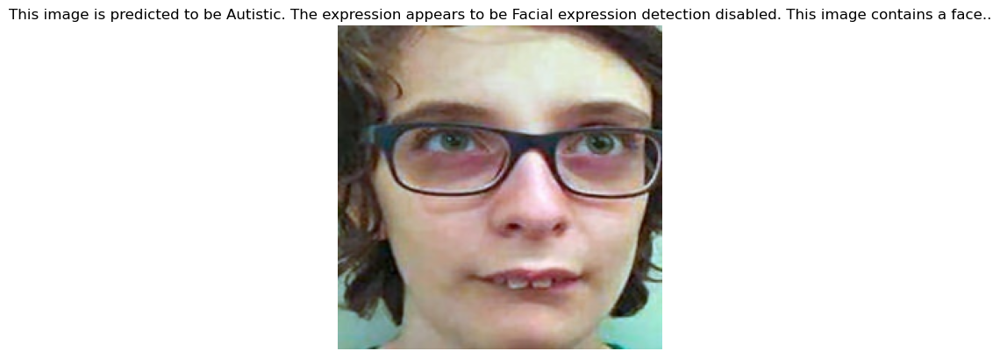

Image 5:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
Image Descriptions:


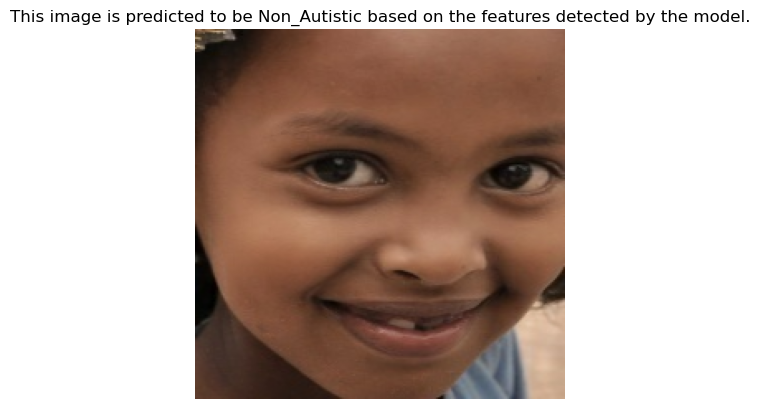

Image 1:
This image is predicted to be Non_Autistic based on the features detected by the model.



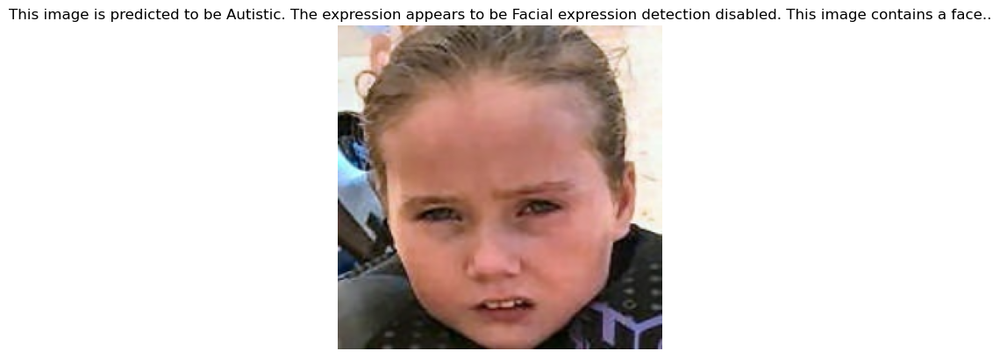

Image 2:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



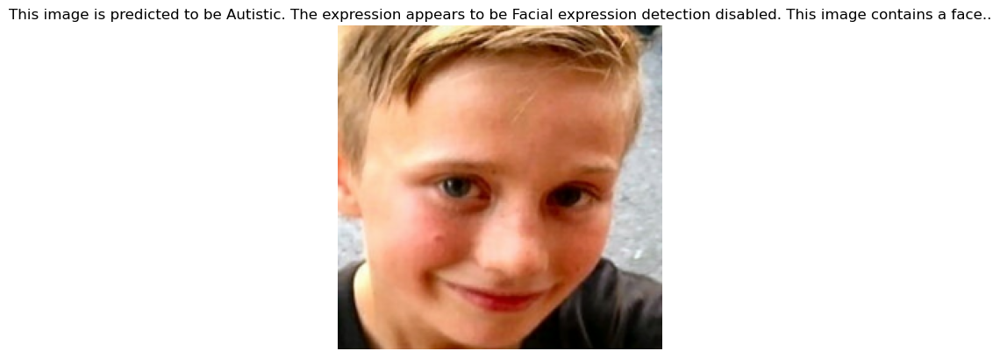

Image 3:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



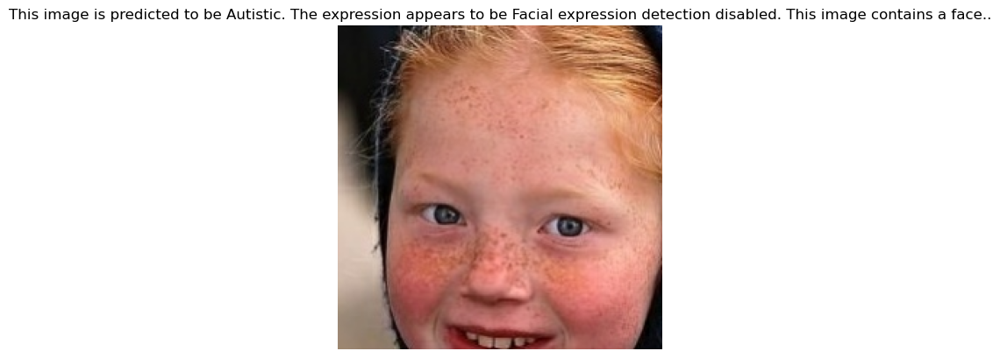

Image 4:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



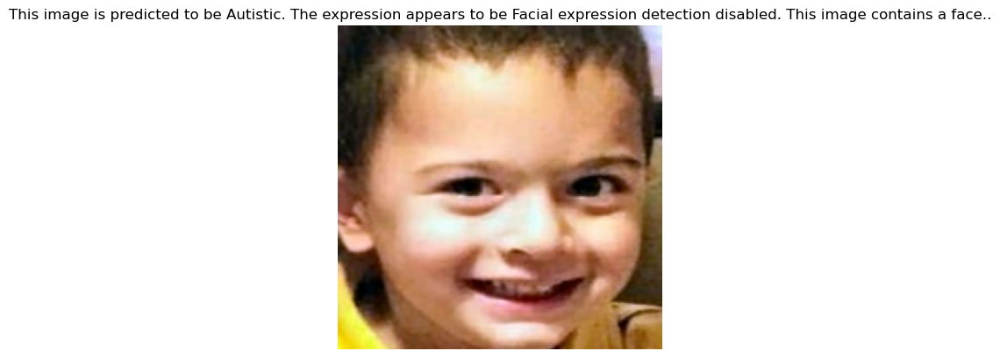

Image 5:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..

Overall Accuracy: 0.8
The overall accuracy is 80.00%.


In [ ]:
# Function to detect facial expression in an image
def detect_expression(image):
    return "Facial expression detection disabled. This image contains a face."

# Reset test_data generator to ensure we start from the beginning
test_data = image_dataset_from_directory(test_dir, batch_size=5, image_size=(224,224),
                                         label_mode='categorical', shuffle=True, seed=42)

# Number of random images to evaluate
num_images = 2

# Initialize a variable to count correct predictions
correct_predictions = 0

# Randomly select num_images individual images from the entire dataset
random_images = random.sample(list(test_data.as_numpy_iterator()), num_images)

# Initialize a list to store descriptions for each image
image_descriptions = []

for i, (image_batch, label_batch) in enumerate(random_images):
    # Predict class labels for the image batch
    predictions = model2.predict(image_batch)

    # Show images and display accuracy
    print("Image Descriptions:")
    for j in range(len(image_batch)):
        true_label = class_names[tf.argmax(label_batch[j])]
        predicted_label = class_names[tf.argmax(predictions[j])]

        # Check if the prediction is correct
        is_correct = true_label == predicted_label
        if is_correct:
            correct_predictions += 1

        # Generate a description for the image
        if predicted_label == 'Autistic':
            expression = detect_expression(image_batch[j])
            if expression:
                description = f"This image is predicted to be {predicted_label}. The expression appears to be {expression}."
            else:
                description = f"This image is predicted to be {predicted_label}. Facial expression detection is disabled."
        else:
            description = f"This image is predicted to be {predicted_label} based on the features detected by the model."

        image_descriptions.append(description)

        # Display the image
        plt.imshow(image_batch[j]/255.)
        plt.axis("off")
        plt.title(description)
        plt.show()

        # Print the description
        print(f"Image {j+1}:")
        print(description)
        print()

# Calculate overall accuracy
overall_accuracy = correct_predictions / (num_images * len(image_batch))
print("Overall Accuracy:", overall_accuracy)
print(f"The overall accuracy is {overall_accuracy:.2%}.")



## efficientnetbo model

In [ ]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense

# Load the pre-trained EfficientNetB0 model without the top classification layer
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the pre-trained model
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top of the pre-trained model
model3 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dense(class_count, activation='softmax')
])

# Compile the model
model3.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history3= model3.fit(train_data, validation_data=val_data, epochs=10)


Epoch 1/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 94s 929ms/step - accuracy: 0.7050 - loss: 0.5656 - val_accuracy: 0.7687 - val_loss: 0.4598
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 65s 883ms/step - accuracy: 0.8012 - loss: 0.4312 - val_accuracy: 0.7857 - val_loss: 0.4436
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 63s 850ms/step - accuracy: 0.8178 - loss: 0.3955 - val_accuracy: 0.7857 - val_loss: 0.4201
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 64s 860ms/step - accuracy: 0.8198 - loss: 0.3826 - val_accuracy: 0.7857 - val_loss: 0.4306
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 63s 855ms/step - accuracy: 0.8338 - loss: 0.3516 - val_accuracy: 0.7857 - val_loss: 0.4368
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 64s 861ms/step - accuracy: 0.8714 - loss: 0.3121 - val_accuracy: 0.7891 - val_loss: 0.4557
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 66s 887ms/step - accuracy: 0.8694 - loss: 0.2924 - val_accuracy: 0.7891 - val_loss: 0.4744
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 64s 865ms/step - accuracy: 0.8929 - loss: 0.2576 - val_accu

## training and validation accuracy

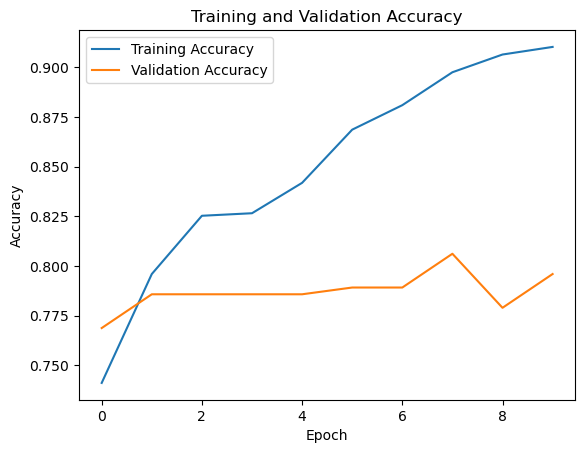

In [ ]:
# Plot training and validation accuracy
plt.plot(history3.history['accuracy'], label='Training Accuracy')
plt.plot(history3.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

## training and valdation loss

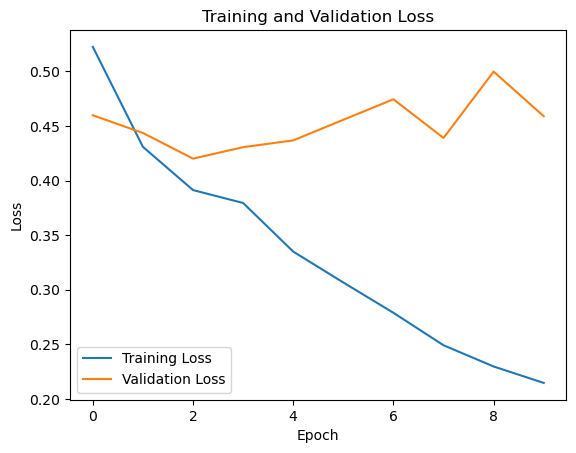

In [ ]:
# Plot training and validation loss
plt.plot(history3.history['loss'], label='Training Loss')
plt.plot(history3.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

## efficientnetbo accuracy

Found 294 files belonging to 2 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
Image Descriptions:


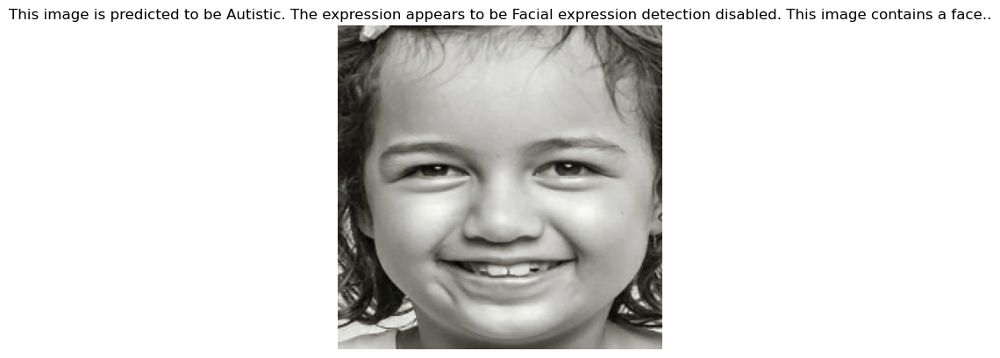

Image 1:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



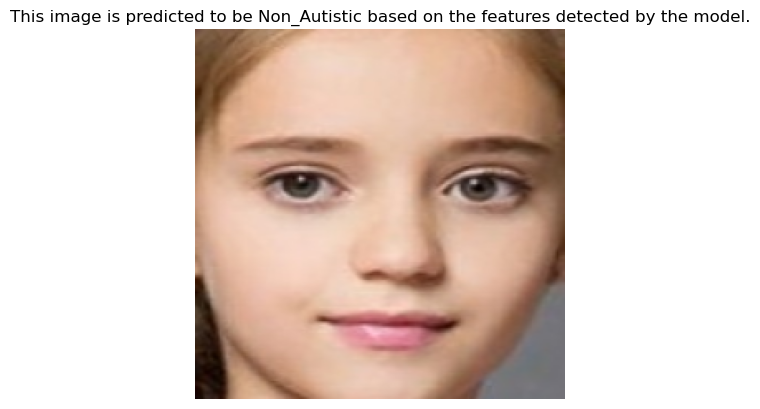

Image 2:
This image is predicted to be Non_Autistic based on the features detected by the model.



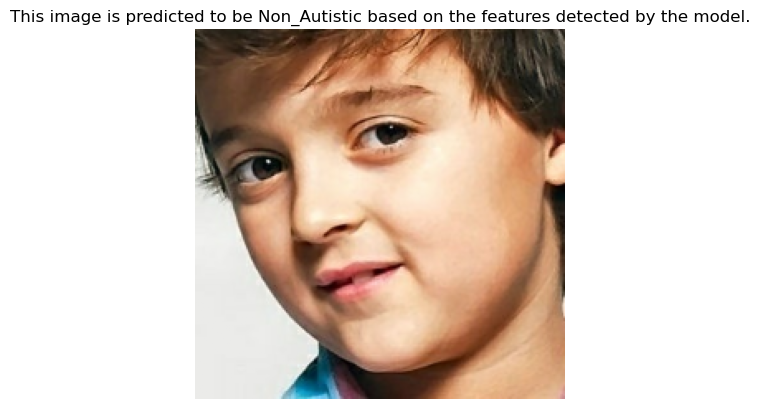

Image 3:
This image is predicted to be Non_Autistic based on the features detected by the model.



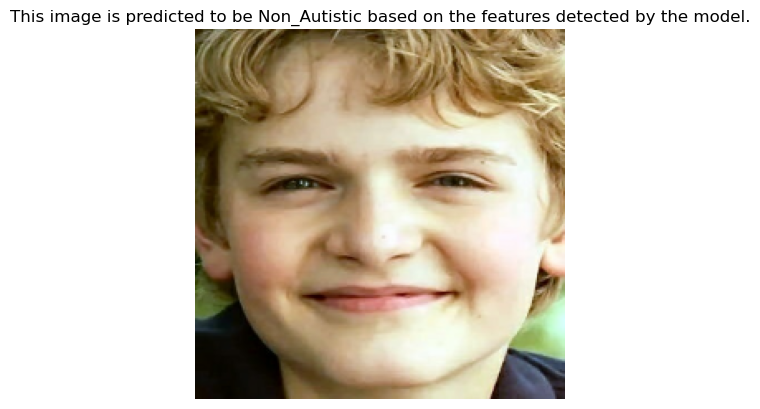

Image 4:
This image is predicted to be Non_Autistic based on the features detected by the model.



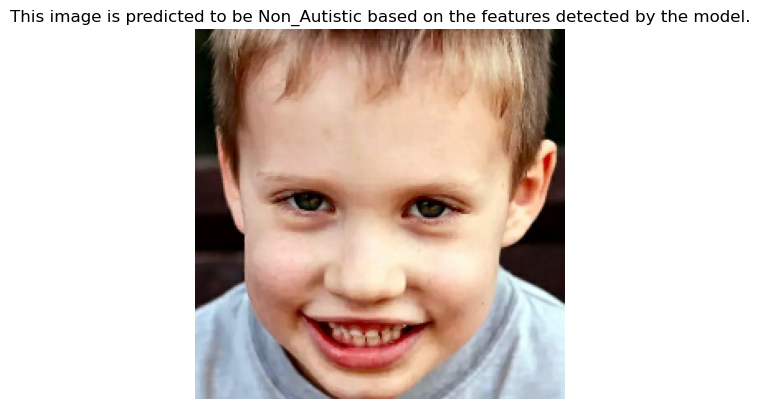

Image 5:
This image is predicted to be Non_Autistic based on the features detected by the model.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
Image Descriptions:


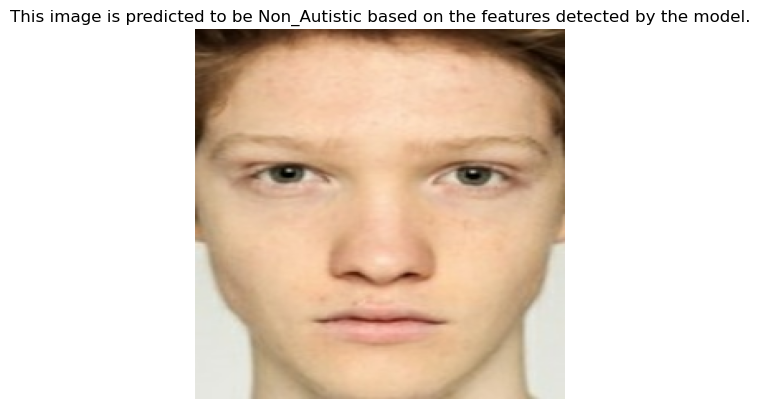

Image 1:
This image is predicted to be Non_Autistic based on the features detected by the model.



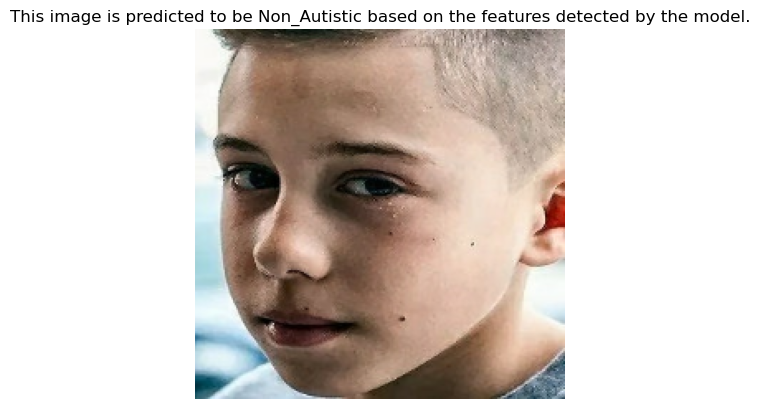

Image 2:
This image is predicted to be Non_Autistic based on the features detected by the model.



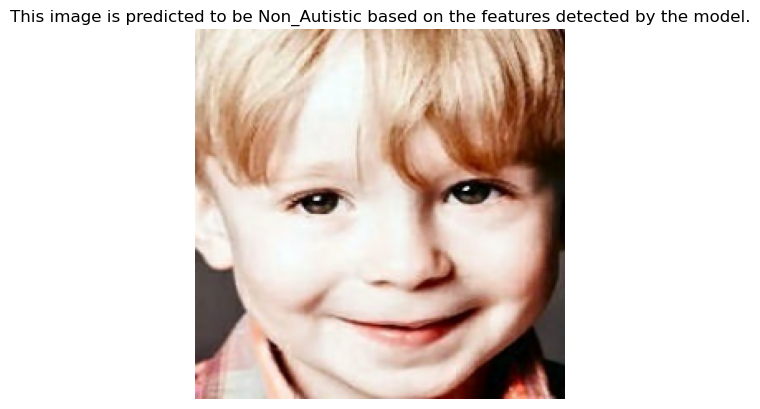

Image 3:
This image is predicted to be Non_Autistic based on the features detected by the model.



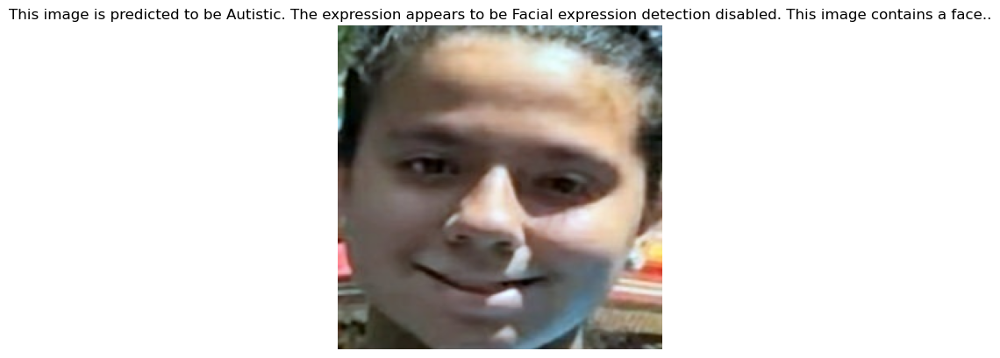

Image 4:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



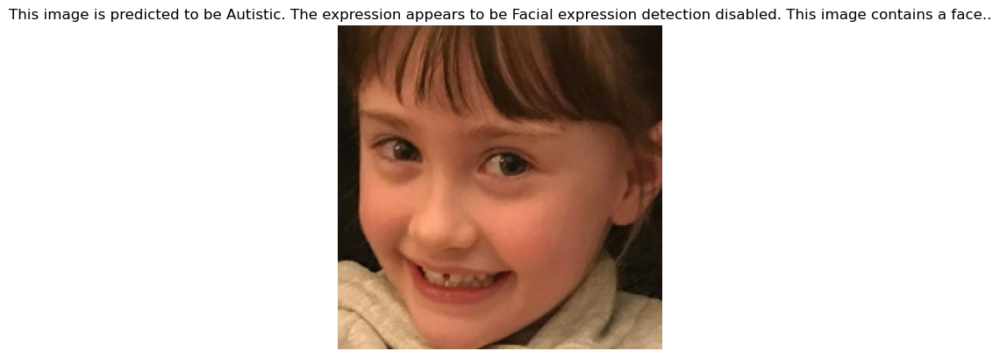

Image 5:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..

Overall Accuracy: 0.9
The overall accuracy is 90.00%.


In [ ]:
# Function to detect facial expression in an image
def detect_expression(image):
    return "Facial expression detection disabled. This image contains a face."

# Reset test_data generator to ensure we start from the beginning
test_data = image_dataset_from_directory(test_dir, batch_size=5, image_size=(224,224),
                                         label_mode='categorical', shuffle=True, seed=42)

# Number of random images to evaluate
num_images = 2

# Initialize a variable to count correct predictions
correct_predictions = 0

# Randomly select num_images individual images from the entire dataset
random_images = random.sample(list(test_data.as_numpy_iterator()), num_images)

# Initialize a list to store descriptions for each image
image_descriptions = []

for i, (image_batch, label_batch) in enumerate(random_images):
    # Predict class labels for the image batch
    predictions = model3.predict(image_batch)

    # Show images and display accuracy
    print("Image Descriptions:")
    for j in range(len(image_batch)):
        true_label = class_names[tf.argmax(label_batch[j])]
        predicted_label = class_names[tf.argmax(predictions[j])]

        # Check if the prediction is correct
        is_correct = true_label == predicted_label
        if is_correct:
            correct_predictions += 1

        # Generate a description for the image
        if predicted_label == 'Autistic':
            expression = detect_expression(image_batch[j])
            if expression:
                description = f"This image is predicted to be {predicted_label}. The expression appears to be {expression}."
            else:
                description = f"This image is predicted to be {predicted_label}. Facial expression detection is disabled."
        else:
            description = f"This image is predicted to be {predicted_label} based on the features detected by the model."

        image_descriptions.append(description)

        # Display the image
        plt.imshow(image_batch[j]/255.)
        plt.axis("off")
        plt.title(description)
        plt.show()

        # Print the description
        print(f"Image {j+1}:")
        print(description)
        print()

# Calculate overall accuracy
overall_accuracy = correct_predictions / (num_images * len(image_batch))
print("Overall Accuracy:", overall_accuracy)
print(f"The overall accuracy is {overall_accuracy:.2%}.")


## resnet50 model

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense

# Load the pre-trained ResNet50 model without the top classification layer
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the pre-trained model
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top of the pre-trained model
model4= Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dense(class_count, activation='softmax')
])

# Compile the model
model4.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history4 = model4.fit(train_data, validation_data=val_data, epochs=10)


Epoch 1/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 182s 2s/step - accuracy: 0.6815 - loss: 0.6299 - val_accuracy: 0.7823 - val_loss: 0.4454
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 158s 2s/step - accuracy: 0.8174 - loss: 0.4011 - val_accuracy: 0.7721 - val_loss: 0.4972
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 154s 2s/step - accuracy: 0.8472 - loss: 0.3585 - val_accuracy: 0.7925 - val_loss: 0.4214
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 154s 2s/step - accuracy: 0.8532 - loss: 0.3254 - val_accuracy: 0.7891 - val_loss: 0.4255
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 155s 2s/step - accuracy: 0.8595 - loss: 0.2965 - val_accuracy: 0.8095 - val_loss: 0.4530
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - accuracy: 0.9005 - loss: 0.2511 - val_accuracy: 0.8061 - val_loss: 0.4024
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 160s 2s/step - accuracy: 0.9075 - loss: 0.2355 - val_accuracy: 0.8061 - val_loss: 0.4174
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 164s 2s/step - accuracy: 0.9026 - loss: 0.2340 - val_accuracy: 0.7959 - v

## training and validation accuracy

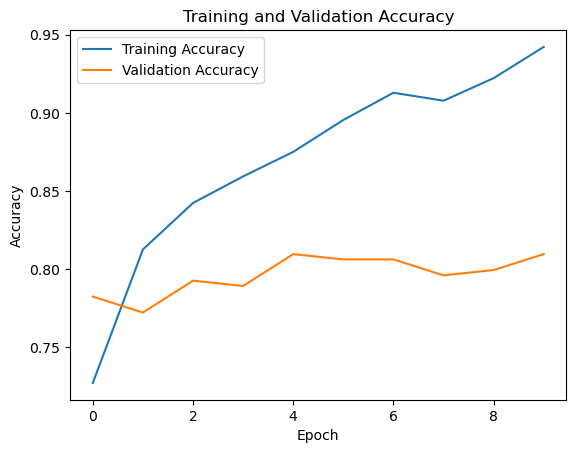

In [ ]:
# Plot training and validation accuracy
plt.plot(history4.history['accuracy'], label='Training Accuracy')
plt.plot(history4.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

## training and validation loss

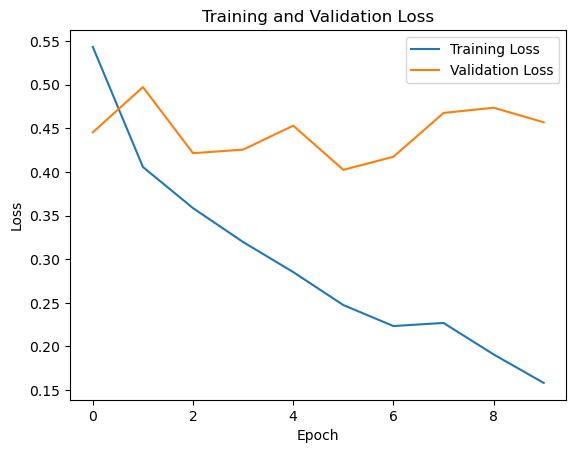

In [ ]:
# Plot training and validation loss
plt.plot(history4.history['loss'], label='Training Loss')
plt.plot(history4.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

## resnet50 accuracy

Found 294 files belonging to 2 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Image Descriptions:


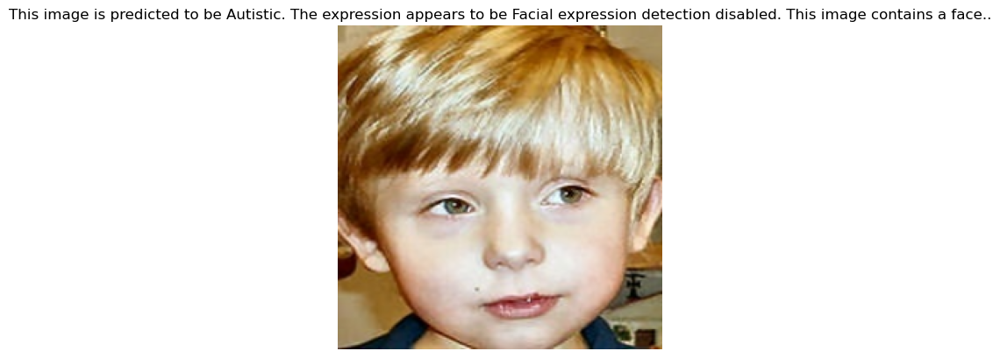

Image 1:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



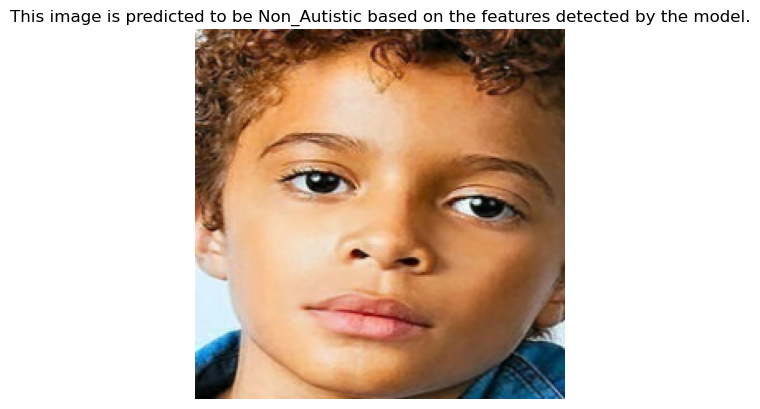

Image 2:
This image is predicted to be Non_Autistic based on the features detected by the model.



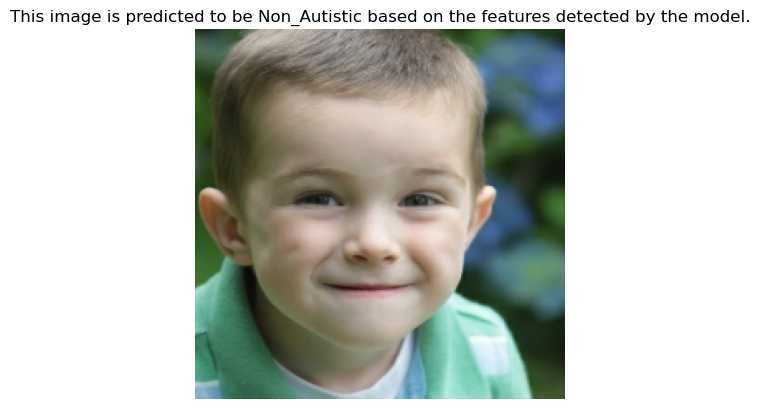

Image 3:
This image is predicted to be Non_Autistic based on the features detected by the model.



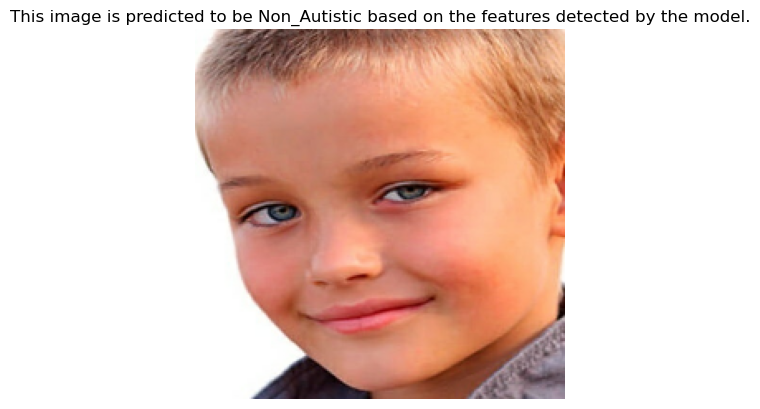

Image 4:
This image is predicted to be Non_Autistic based on the features detected by the model.



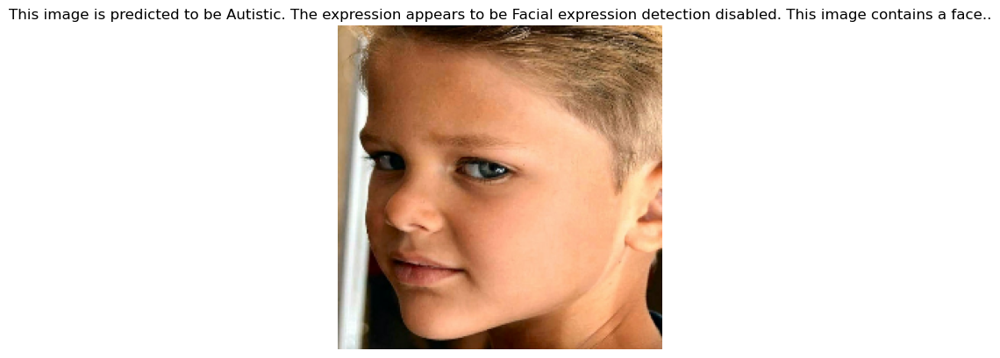

Image 5:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step
Image Descriptions:


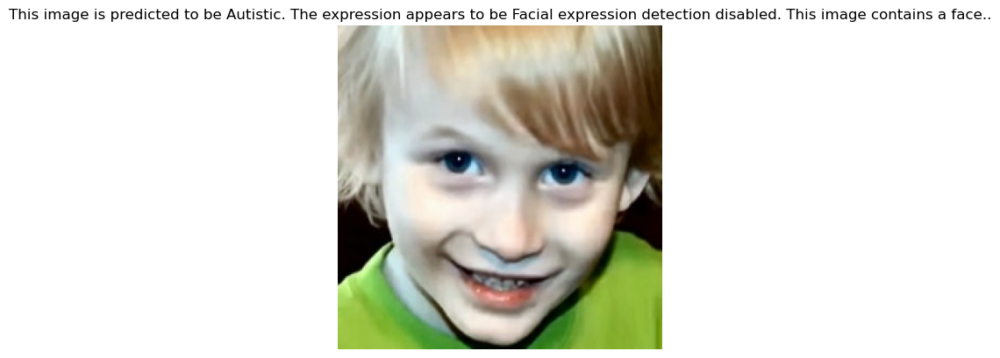

Image 1:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



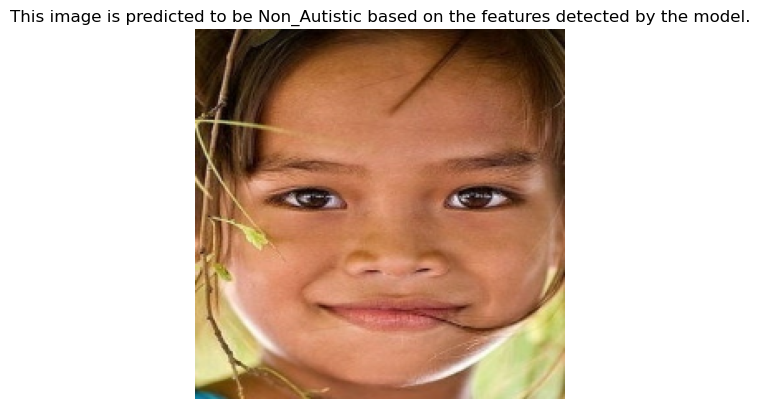

Image 2:
This image is predicted to be Non_Autistic based on the features detected by the model.



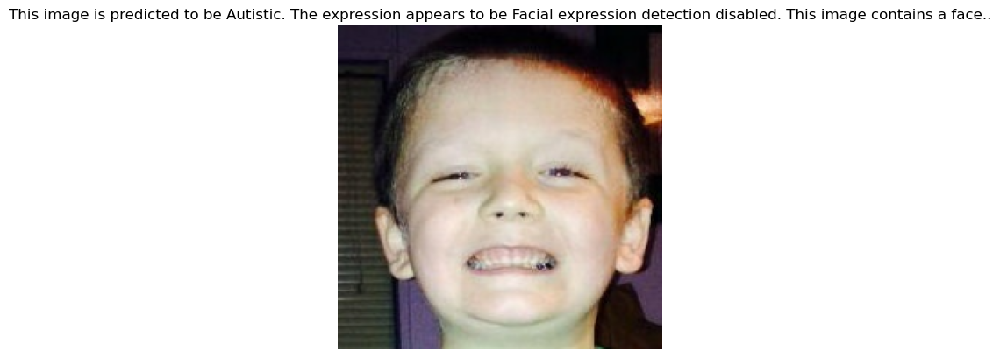

Image 3:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



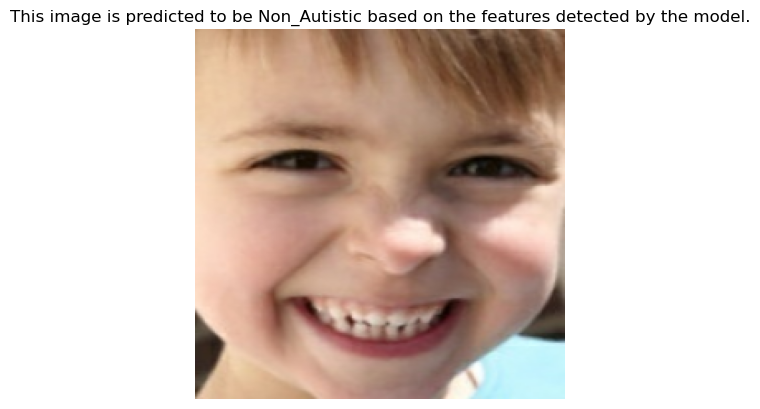

Image 4:
This image is predicted to be Non_Autistic based on the features detected by the model.



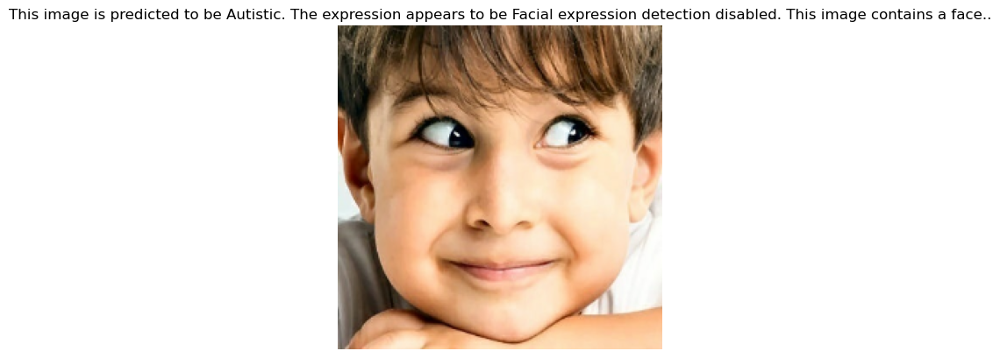

Image 5:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..

Overall Accuracy: 0.8
The overall accuracy is 80.00%.


In [ ]:
# Function to detect facial expression in an image
def detect_expression(image):
    return "Facial expression detection disabled. This image contains a face."

# Reset test_data generator to ensure we start from the beginning
test_data = image_dataset_from_directory(test_dir, batch_size=5, image_size=(224,224),
                                         label_mode='categorical', shuffle=True, seed=42)

# Number of random images to evaluate
num_images = 2

# Initialize a variable to count correct predictions
correct_predictions = 0

# Randomly select num_images individual images from the entire dataset
random_images = random.sample(list(test_data.as_numpy_iterator()), num_images)

# Initialize a list to store descriptions for each image
image_descriptions = []

for i, (image_batch, label_batch) in enumerate(random_images):
    # Predict class labels for the image batch
    predictions = model4.predict(image_batch)

    # Show images and display accuracy
    print("Image Descriptions:")
    for j in range(len(image_batch)):
        true_label = class_names[tf.argmax(label_batch[j])]
        predicted_label = class_names[tf.argmax(predictions[j])]

        # Check if the prediction is correct
        is_correct = true_label == predicted_label
        if is_correct:
            correct_predictions += 1

        # Generate a description for the image
        if predicted_label == 'Autistic':
            expression = detect_expression(image_batch[j])
            if expression:
                description = f"This image is predicted to be {predicted_label}. The expression appears to be {expression}."
            else:
                description = f"This image is predicted to be {predicted_label}. Facial expression detection is disabled."
        else:
            description = f"This image is predicted to be {predicted_label} based on the features detected by the model."

        image_descriptions.append(description)

        # Display the
        plt.imshow(image_batch[j]/255.)
        plt.axis("off")
        plt.title(description)
        plt.show()

        # Print the description
        print(f"Image {j+1}:")
        print(description)
        print()

# Calculate overall accuracy
overall_accuracy = correct_predictions / (num_images * len(image_batch))
print("Overall Accuracy:", overall_accuracy)
print(f"The overall accuracy is {overall_accuracy:.2%}.")



In [ ]:
# Evaluate each model on the validation set and store the results
evaluation_results = {}

# Models to evaluate
models = [model,model2, model3, model4]
model_names = ['cnn','MobileNetV2', 'EfficientNetB0', 'ResNet50']

for name, model in zip(model_names, models):
    loss, accuracy = model.evaluate(val_data)
    evaluation_results[name] = (loss, accuracy)

# Find the best model based on validation accuracy
best_model_name = max(evaluation_results, key=lambda k: evaluation_results[k][1])
best_model_evaluation_result = evaluation_results[best_model_name]

print(f'Best Model: {best_model_name}')
print(f'Validation Accuracy: {best_model_evaluation_result[1]}')

# Print evaluation results for all models
for name, result in evaluation_results.items():
    print(f'Model: {name}, Validation Loss: {result[0]}, Validation Accuracy: {result[1]}')


10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - accuracy: 0.2341 - loss: 0.6935
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 545ms/step - accuracy: 0.7520 - loss: 0.5365
10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 676ms/step - accuracy: 0.7730 - loss: 0.5007
10/10 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.8428 - loss: 0.3836
Best Model: ResNet50
Validation Accuracy: 0.8095238208770752
Model: cnn, Validation Loss: 0.6931473612785339, Validation Accuracy: 0.5
Model: MobileNetV2, Validation Loss: 0.5593476295471191, Validation Accuracy: 0.7210884094238281
Model: EfficientNetB0, Validation Loss: 0.45894867181777954, Validation Accuracy: 0.795918345451355
Model: ResNet50, Validation Loss: 0.4568142592906952, Validation Accuracy: 0.8095238208770752


In [ ]:

# Define and compile the initial CNN model
def get_cnn_model():
    model = Sequential([
        Conv2D(16, (3, 3), activation='relu', input_shape=(224, 224, 3)),
        MaxPooling2D((2, 2)),
        Conv2D(32, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(64, activation='relu'),
        Dense(class_count, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [ ]:
# Initialize pre-trained models
def get_pretrained_model(base_model):
    for layer in base_model.layers:
        layer.trainable = False
    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(128, activation='relu'),
        Dense(class_count, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [ ]:
# Models to evaluate
model_factories = [
    ('cnn', get_cnn_model),
    ('MobileNetV2', lambda: get_pretrained_model(MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3)))),
    ('EfficientNetB0', lambda: get_pretrained_model(EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3)))),
    ('ResNet50', lambda: get_pretrained_model(ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))))
]

In [ ]:
# Load datasets
train_data = image_dataset_from_directory(train_dir, batch_size=32, image_size=(224, 224), label_mode='categorical', shuffle=True, seed=42)

# Convert the dataset to numpy arrays for k-fold cross-validation
def dataset_to_numpy(dataset):
    images = []
    labels = []
    for image, label in dataset:
        images.append(image.numpy())
        labels.append(label.numpy())
    return np.concatenate(images), np.concatenate(labels)

images, labels = dataset_to_numpy(train_data)



Found 2352 files belonging to 2 classes.


In [ ]:
# Ensure that images and labels are NumPy arrays
images = np.array(images)
labels = np.array(labels)

# Define and compile the initial CNN model
def get_cnn_model():
    model = Sequential([
        Conv2D(16, (3, 3), activation='relu', input_shape=(224, 224, 3)),
        MaxPooling2D((2, 2)),
        Conv2D(32, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(64, activation='relu'),
        Dense(class_count, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [ ]:
# Initialize pre-trained models
def get_pretrained_model(base_model):
    for layer in base_model.layers:
        layer.trainable = False
    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(128, activation='relu'),
        Dense(class_count, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [ ]:

# Models to evaluate
model_factories = [
    ('cnn', get_cnn_model),
    ('MobileNetV2', lambda: get_pretrained_model(MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3)))),
    ('EfficientNetB0', lambda: get_pretrained_model(EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3)))),
    ('ResNet50', lambda: get_pretrained_model(ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))))
]

In [ ]:
# Perform k-fold cross-validation
k = 5
kf = KFold(n_splits=k, shuffle=True, random_state=42)
evaluation_results = {name: [] for name, _ in model_factories}

for train_index, val_index in kf.split(images):
    x_train, x_val = images[train_index], images[val_index]
    y_train, y_val = labels[train_index], labels[val_index]

    # Create TensorFlow datasets for training and validation
    train_data = tf.data.Dataset.from_tensor_slices((x_train, y_train)).batch(32)
    val_data = tf.data.Dataset.from_tensor_slices((x_val, y_val)).batch(32)

    for name, model_factory in model_factories:
        model = model_factory()
        model.fit(train_data, validation_data=val_data, epochs=10, verbose=0)
        loss, accuracy = model.evaluate(val_data, verbose=0)
        evaluation_results[name].append(accuracy)

In [ ]:
# Calculate average performance metrics
average_results = {name: np.mean(accuracies) for name, accuracies in evaluation_results.items()}
best_model_name = max(average_results, key=average_results.get)
best_model_accuracy = average_results[best_model_name]

print(f'Best Model: {best_model_name}')
print(f'Average Validation Accuracy: {best_model_accuracy}')

# Print evaluation results for all models
for name, accuracies in evaluation_results.items():
    print(f'Model: {name}, Average Validation Accuracy: {np.mean(accuracies)}')

Best Model: EfficientNetB0
Average Validation Accuracy: 0.8095351576805114
Model: cnn, Average Validation Accuracy: 0.6994172692298889
Model: MobileNetV2, Average Validation Accuracy: 0.7083163976669311
Model: EfficientNetB0, Average Validation Accuracy: 0.8095351576805114
Model: ResNet50, Average Validation Accuracy: 0.7767646908760071


{'cnn': [0.7027601003646851, 0.6666666865348816, 0.7042553424835205, 0.7127659320831299, 0.7106382846832275], 'MobileNetV2': [0.7027601003646851, 0.7537155151367188, 0.7085106372833252, 0.6659574508666992, 0.7106382846832275], 'EfficientNetB0': [0.7961783409118652, 0.7961783409118652, 0.8574467897415161, 0.806382954120636, 0.7914893627166748], 'ResNet50': [0.7855626344680786, 0.8174097537994385, 0.7957446575164795, 0.693617045879364, 0.7914893627166748]}
Best Model: EfficientNetB0
Average Validation Accuracy: 0.8095351576805114
Model: cnn, Average Validation Accuracy: 0.6994172692298889
Model: MobileNetV2, Average Validation Accuracy: 0.7083163976669311
Model: EfficientNetB0, Average Validation Accuracy: 0.8095351576805114
Model: ResNet50, Average Validation Accuracy: 0.7767646908760071


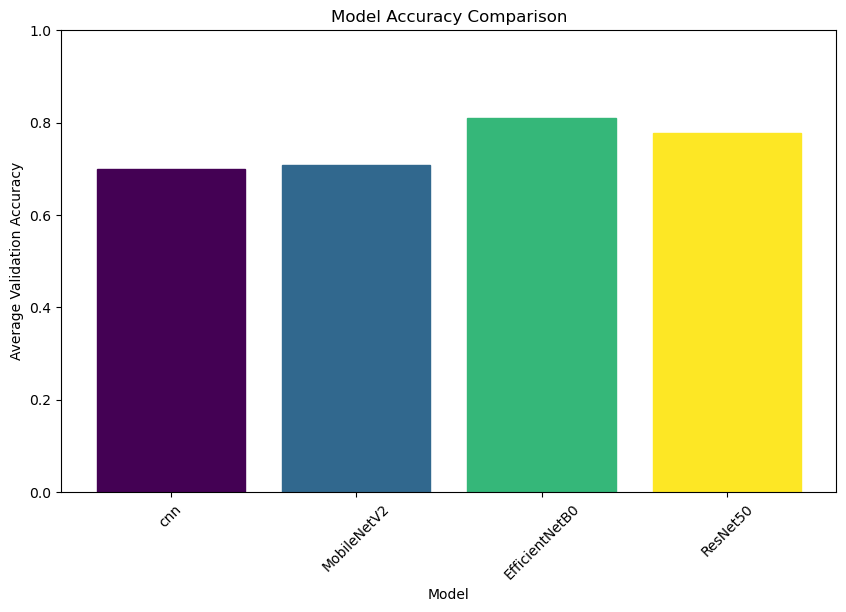

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Check the structure of evaluation_results
print(evaluation_results)

# Calculate average performance metrics
average_results = {name: np.mean(metrics) if isinstance(metrics[0], float) else np.mean([result[1] for result in metrics]) for name, metrics in evaluation_results.items()}
best_model_name = max(average_results, key=average_results.get)
best_model_accuracy = average_results[best_model_name]

print(f'Best Model: {best_model_name}')
print(f'Average Validation Accuracy: {best_model_accuracy}')

# Print evaluation results for all models
for name, accuracy in average_results.items():
    print(f'Model: {name}, Average Validation Accuracy: {accuracy}')

# Extract model names and average accuracies for plotting
model_names = list(average_results.keys())
avg_accuracies = [average_results[name] for name in model_names]

# Define a colormap
colors = plt.cm.viridis(np.linspace(0, 1, len(model_names)))

# Plotting accuracy
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, avg_accuracies, color=colors)
plt.xlabel('Model')
plt.ylabel('Average Validation Accuracy')
plt.title('Model Accuracy Comparison')
plt.ylim(0, 1)
plt.xticks(rotation=45)

# Add color labels to the bars
for bar, color in zip(bars, colors):
    bar.set_color(color)

plt.show()
